# VGG16 - Thiago Garbin

### Comparação de algoritmos de aprendizado não supervisionado em features de imagens

In [67]:
# Para evitar divergência de resultados no random_state ao executar, é preciso ter a última versão do scikit-learn (0.24.2)

In [66]:
import pandas as pd
import numpy as np
import sklearn

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

from scipy.cluster.hierarchy import dendrogram

from sklearn.metrics import accuracy_score
from sklearn.metrics.cluster import completeness_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import matplotlib.cm as cm

from PIL import Image
import PIL

In [2]:
df = pd.DataFrame()

In [3]:
df['Path'] = np.load('trabalho_II_data/paths.npy')
df['Class'] = np.load('trabalho_II_data/labels.npy')

In [4]:
df.head()
# df.sample(20)
# df.shape

,Path,Class
0,natural_images_100\airplane\airplane_0016.jpg,0
1,natural_images_100\airplane\airplane_0029.jpg,0
2,natural_images_100\airplane\airplane_0030.jpg,0
3,natural_images_100\airplane\airplane_0038.jpg,0
4,natural_images_100\airplane\airplane_0047.jpg,0


In [5]:
VGG16 = np.load('trabalho_II_data/vgg16_features.npy')
df_aux = pd.DataFrame(VGG16)

In [6]:
df_aux.shape

(800, 4096)

In [7]:
result = pd.concat([df, df_aux], axis=1)

In [8]:
result.head()

,Path,Class,0,1,2,3,4,5,6,7,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,natural_images_100\airplane\airplane_0016.jpg,0,0.0,1.495933,0.000000,0.605953,0.0,0.026664,0.00000,0.0,...,0.000000,0.878309,0.0,0.000000,0.000000,0.000000,0.000000,1.618905,2.817235,0.000000
1,natural_images_100\airplane\airplane_0029.jpg,0,0.0,0.051579,0.744123,0.474415,0.0,0.000000,0.00000,0.0,...,0.000000,0.650801,0.0,0.000000,0.155518,0.000000,0.519906,1.448152,1.217532,0.000000
2,natural_images_100\airplane\airplane_0030.jpg,0,0.0,0.000000,0.095944,0.311806,0.0,0.403601,0.21727,0.0,...,0.167445,0.000000,0.0,0.470673,0.000000,0.000000,0.117167,1.430017,0.144217,0.100071
3,natural_images_100\airplane\airplane_0038.jpg,0,0.0,0.017942,0.000000,0.012501,0.0,0.000000,0.00000,0.0,...,0.000000,0.000000,0.0,1.032871,1.396886,0.000000,0.661979,1.160728,0.000000,0.000000
4,natural_images_100\airplane\airplane_0047.jpg,0,0.0,1.439261,0.000000,0.454595,0.0,0.000000,0.00000,0.0,...,0.108758,0.000000,0.0,0.144011,0.000000,0.083954,0.000000,0.934726,0.793586,0.000000


In [9]:
df_train = result.drop(columns=['Path', 'Class'])

In [10]:
df_labels = result['Class']

In [11]:
# df_train.head()
# df_labels.head()

classes = ['airplane', 'car', 'cat', 'dog', 'flower', 'fruit', 'motorbike', 'person']

### 1 - K-Means

In [12]:
# Método elbow com configuração padrão do k-means para confirmar que o número ideal de clusters é 8,
# baseado na inércia

clusters_range = range(1, int(np.sqrt(len(df_train))) + 1)

inertias = []
for k in clusters_range:
    
    model_k_m = KMeans(n_clusters=k)
    model_k_m.fit(df_train)
    
    inertias.append(model_k_m.inertia_)

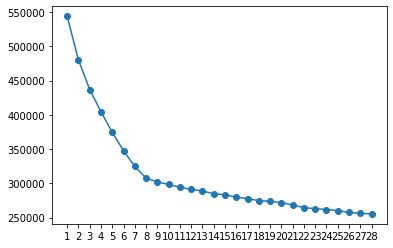

In [13]:
plt.plot(clusters_range, inertias, '-o')
plt.xticks(clusters_range)
plt.show()

In [14]:
# K-Means com k=8, o mesmo número dos ground truth, e dois diferentes modos de inicialização

state = 35

k = 8

model_k_m = KMeans(n_clusters=k, random_state=state)
model_k_m.fit(df_train)

model_k_a = KMeans(n_clusters=k, init='random', random_state=state)
model_k_a.fit(df_train)

KMeans(init='random', random_state=35)

In [15]:
print('Índices externos')

ars = adjusted_rand_score(model_k_m.labels_, df_labels)
comp = completeness_score(model_k_m.labels_, df_labels)
print('\nInicialização K-Means++\nAdjusted Rand Index: {:.4f}\nCompleteness Score: {:.4f}'.format(ars, comp))

ars = adjusted_rand_score(model_k_a.labels_, df_labels)
comp = completeness_score(model_k_a.labels_, df_labels)
print('\nInicialização Random\nAdjusted Rand Index: {:.4f}\nCompleteness Score: {:.4f}'.format(ars, comp))

Índices externos

Inicialização K-Means++
Adjusted Rand Index: 0.9914
Completeness Score: 0.9899

Inicialização Random
Adjusted Rand Index: 0.8255
Completeness Score: 0.9061


In [16]:
def plot_silhouette(data, model, nome_modelo):
    """
    Method from Scikit-learn with some changes.
    Source: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
    """
    k = model.n_clusters
    cluster_labels = model.labels_
    X = data.values
        
    fig, ax = plt.subplots()
    fig.set_size_inches(8, 6)
    
    ax.set_xlim([-0.1, 1])

    ax.set_ylim([0, len(X) + (k + 1) * 10])

    silhouette_avg = silhouette_score(X, cluster_labels)
    print('Para n_clusters =', k,
          'o Silhouette Score médio é:', silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(k):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title('O Silhouette Plot para vários grupos.')
    ax.set_xlabel('Os valores do Silhouette Coefficient')
    ax.set_ylabel('Cluster')

    ax.axvline(x=silhouette_avg, color='red', linestyle='--')

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle('Silhouette Analysis do {} n_clusters = {}'.format(nome_modelo, k),
                 fontsize=14, fontweight='bold')

    plt.show()

Índice interno: Silhueta

Inicialização K-Means++
Para n_clusters = 8 o Silhouette Score médio é: 0.20089175


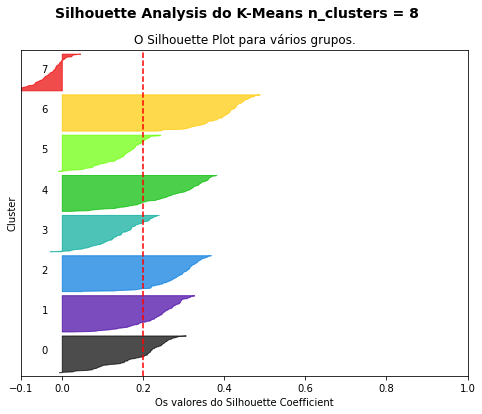


Inicialização Random
Para n_clusters = 8 o Silhouette Score médio é: 0.18721302


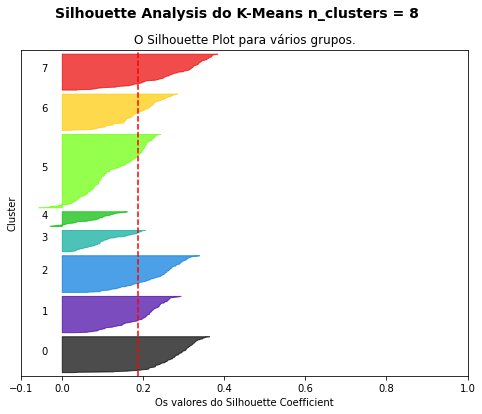

In [17]:
print('Índice interno: Silhueta')

print('\nInicialização K-Means++')
plot_silhouette(df_train, model_k_m, 'K-Means')

print('\nInicialização Random')
plot_silhouette(df_train, model_k_a, 'K-Means')

In [18]:
# Analisando Clusters gerados pelo K-Means com k=8 e inicialização padrão otimizada (k-means++)

print(np.unique(model_k_m.labels_, return_counts=True))

a = 0
for cl in classes:
    print('\nClasse original:', cl)
    print(np.unique(model_k_m.labels_[0+(a*100):100+(a*100)], return_counts=True))
    print(model_k_m.labels_[0+(a*100):100+(a*100)])
    a += 1

(array([0, 1, 2, 3, 4, 5, 6, 7]), array([101, 100,  99, 100,  99, 100, 100, 101], dtype=int64))

Classe original: airplane
(array([4, 7]), array([99,  1], dtype=int64))
[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 7 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]

Classe original: car
(array([2, 7]), array([99,  1], dtype=int64))
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 7 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]

Classe original: cat
(array([0]), array([100], dtype=int64))
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

Classe original: dog
(array([0, 7]), array([ 1, 99], dtype=int64))
[7 7 7 7 7 7 7 7 7 7 

Avião agrupado como cachorro:
natural_images_100\airplane\airplane_0161.jpg Cluster: 7


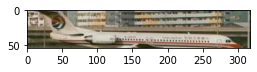


Carro agrupado como cachorro:
natural_images_100\car\car_0109.jpg Cluster: 7


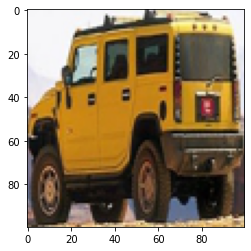


Cachorro agrupado como gato:
natural_images_100\dog\dog_0681.jpg Cluster: 0


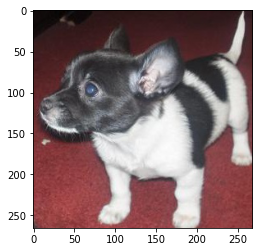

In [19]:
# Mostrando imagens dos objetos atribuídos a clusters que não correspondem a suas classes

plt.rcParams['figure.figsize'] = (4, 4)

print('Avião agrupado como cachorro:')
for idx, c in enumerate(model_k_m.labels_[0:100]):
    if c != 4:
        print(result.iloc[idx]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        
print('\nCarro agrupado como cachorro:')        
for idx, c in enumerate(model_k_m.labels_[100:200]):
    if c != 2:
        print(result.iloc[idx+100]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+100]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        
print('\nCachorro agrupado como gato:')        
for idx, c in enumerate(model_k_m.labels_[300:400]):
    if c != 7:
        print(result.iloc[idx+300]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+300]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()


In [20]:
# Analisando Clusters gerados pelo K-Means com k=8 e inicialização padrão aleatória (random)

a = 0
for cl in classes:
    print('Classe original:', cl)
    print(model_k_a.labels_[0+(a*100):100+(a*100)])
    a += 1

Classe original: airplane
[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 5 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]
Classe original: car
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 5 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Classe original: cat
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
Classe original: dog
[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 2]
Classe original: flower
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 

(array([3, 4]), array([59, 41], dtype=int64))


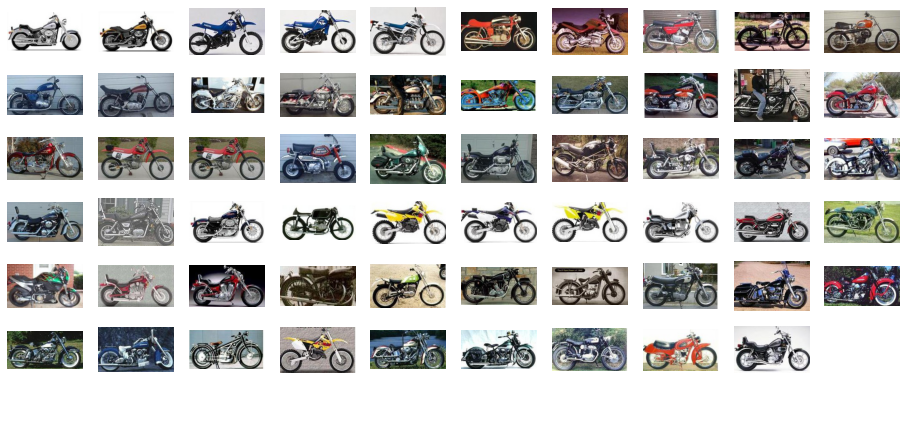

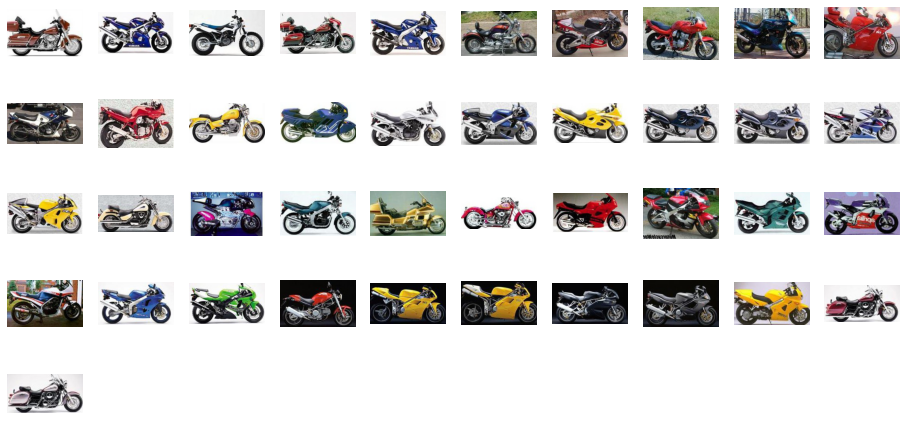

In [21]:
# Exibindo imagem dos dois cluesters que o algoritmo gerou para a classe de motos

print(np.unique(model_k_a.labels_[600:700], return_counts=True))

plt.rcParams['figure.figsize'] = (16, 8)

cluster3 = []
cluster4 = []

for idx, c in enumerate(model_k_a.labels_[600:700]):
    if c == 3:
        cluster3.append(result.iloc[idx+600]['Path'])
    else:
        cluster4.append(result.iloc[idx+600]['Path'])

for cl in [cluster3, cluster4]:
    nrows = int((len(cl)+1)/8)
    ncols = 10
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.show()

In [22]:
# Originalmente temos 8 classes de imagens. Para avaliar o K-Means com as features do VGG16 e com k=8,
# comparando com os ground truth, utilizou-se como índices externos o adjusted rand index e o completeness score.
# Este último indica se os elementos de uma classe fazem parte de um mesmo cluster, conforme menciona a
# documentação do scikit-learn.

# Desta forma, consideramdo o modo de inicialização padrão (k-means++) e os índices externos, o desempenho do k-means
# foi bastante satisfatório, com pontuação de 0.9914 para o adjusted rand index e 0,9899 para o completeness score.
# Analisando visualmente, temos que apenas 3 itens foram atribuídos a clusters errados.
# Mesmo rodando novamente o algoritmo mais algumas vezes com outros valores de random state, estes eram os resultado que
# mais se repetiam.
# Quanto ao índice interno, foi utilizado o silhouette score, obtendo um valor não muito satisfatório de 0,2009.
# Uma possibilidade para este valor não ter sido mais elevado é o alto número de features em conjunto com a
# forma de cálculo padrão, que considera a distância euclidiana.

# Já com o modo de inicialização aleatório (random), os índices externos foram mais baixos em grande parte das vezes em que
# o algoritmo foi rodado com diferentes valores de random state. Considerando random_state=35, por exemplo,
# o adjusted rand index ficou em 0.8255 e o completeness score ficou em 0.9061. Ou seja, em alguns grupos
# não seconseguiu agrupar as imagens conforme os ground truth.
# É possível notar que, por exemplo, pessoas e cachorros tornaram-se um só cluster, enquanto o cluster das motos foi
# dividido em dois, nos quais é possível ver que, em geral, as motos carenadas de maior porte ficaram no segundo cluster
# e aquelas com estilo motocross ficaram no primeiro cluster.
# No que se refere ao silhouette score, este ficou um pouco abaixo do visto na inicialização otimizada, com 0,1872. 


In [23]:
# K-Means com k=4, metade do número de classes originais e inicialização k-means++ pois esta tende a gerar clusters
# mais concisos.

random = 35

k = 4

model_k_m = KMeans(n_clusters=k, random_state=random)
model_k_m.fit(df_train)

KMeans(n_clusters=4, random_state=35)

In [24]:
a = 0
for cl in classes:
    print('Classe original:', cl)
    print(model_k_m.labels_[0+(a*100):100+(a*100)])
    a += 1

Classe original: airplane
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
Classe original: car
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
Classe original: cat
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
Classe original: dog
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]
Classe original: flower
[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 

In [25]:
# Para k=4 e inicialização otimizada (k-means++), nota-se que os aviões ficaram sozinhos em um grupo
# mesmo rodando o algoritmo diversas vezes.


Classe: airplane


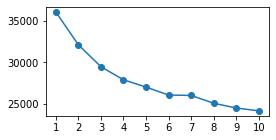

Classe: car


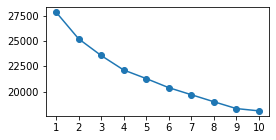

Classe: cat


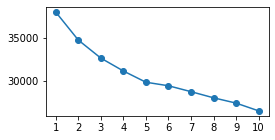

Classe: dog


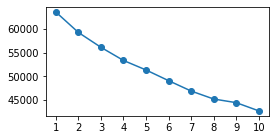

Classe: flower


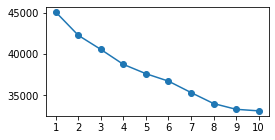

Classe: fruit


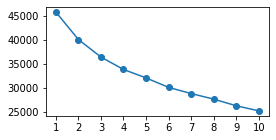

Classe: motorbike


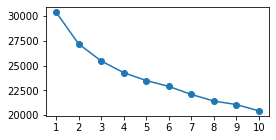

Classe: person


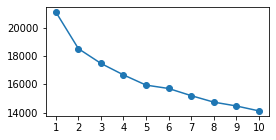

In [26]:
# Analisando para quais classes o K-Means consegue gerar um bom gráfico para o método elbow para
# uma possível geração de subgrupos

plt.rcParams['figure.figsize'] = (4, 2)

for i, cl in enumerate(classes) :
    
    print('Classe:', cl)
    clusters_range = range(1, int(np.sqrt(len(df_train[0+(i*100):100+(i*100)]))) + 1)
    inertias = []  
    for k in clusters_range:

        model_k_m = KMeans(n_clusters=k)
        model_k_m.fit(df_train[0+(i*100):100+(i*100)])

        inertias.append(model_k_m.inertia_)
    
    plt.plot(clusters_range, inertias, '-o')
    plt.xticks(clusters_range)
    plt.show()

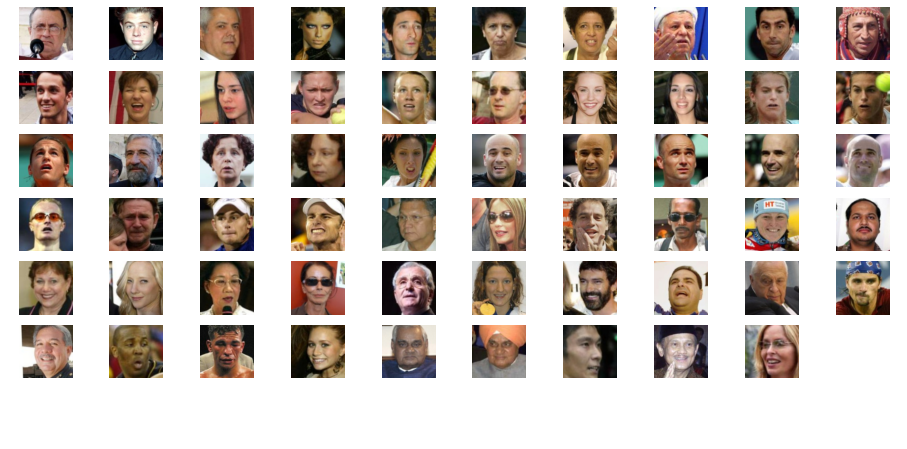

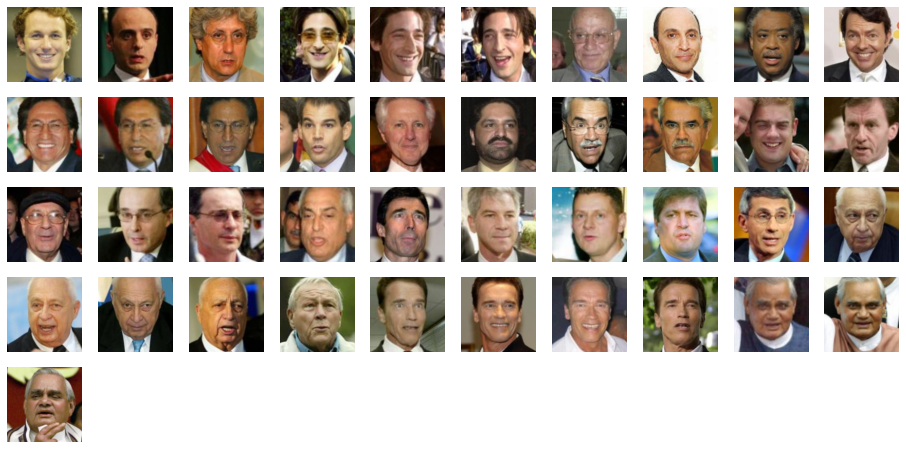

In [28]:
# A classe person tem os valores mais baixos de inércia e é a que mais se aproxima de um gráfico elbow aceitável, com k=2

plt.rcParams['figure.figsize'] = (16, 8)

k = 2

model_k_m = KMeans(n_clusters=k)
model_k_m.fit(df_train[700:800])

cluster0 = []
cluster1 = []

for idx, c in enumerate(model_k_m.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+700]['Path'])
    else:
        cluster1.append(result.iloc[idx+700]['Path'])
        
for cl in [cluster0, cluster1]:
    
    ncols = 10
    nrows = int((len(cl)+1)/(ncols-2))
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.show()


In [29]:
# Analisando a classe person para k=2 é possível notar que todas as mulheres foram colocadas no primeiro cluster.

### 2 - Hierarchical Agglomerative Clustering (HAC)

In [30]:
# Pedindo ao HAC para encontrar 8 clusters, mesmo número de classes ground truth, para cada método linkage
# e exibindo índices externos.
# O método Agglomerative Clustering do Scikit-learn permite escolher o número de clusters ou o limiar de distância de corte.

criterion = ['single', 'average', 'complete', 'ward']

print('Índices externos:')

for crit in criterion:
    model_hac = AgglomerativeClustering(n_clusters=8, compute_distances=True, linkage=crit)
    model_hac.fit(df_train)
    ars = adjusted_rand_score(model_hac.labels_, df_labels)
    comp = completeness_score(model_hac.labels_, df_labels)
    print('\nCritério:', crit)
    print(np.unique(model_hac.labels_, return_counts=True))
    print('Adjusted Rand Index: {:.4f}\nCompleteness Score: {:.4f}'.format(ars, comp))

Índices externos:

Critério: single
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([793,   1,   1,   1,   1,   1,   1,   1], dtype=int64))
Adjusted Rand Index: 0.0001
Completeness Score: 0.0088

Critério: average
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([  3, 786,   2,   5,   1,   1,   1,   1], dtype=int64))
Adjusted Rand Index: 0.0004
Completeness Score: 0.0178

Critério: complete
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([ 17, 282, 246,   4,  97,  54,  99,   1], dtype=int64))
Adjusted Rand Index: 0.4961
Completeness Score: 0.6489

Critério: ward
(array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64), array([100, 102, 100, 100,  98, 100, 100, 100], dtype=int64))
Adjusted Rand Index: 0.9887
Completeness Score: 0.9885


Índice interno: Silhueta para o critério ward
Para n_clusters = 8 o Silhouette Score médio é: 0.19955587


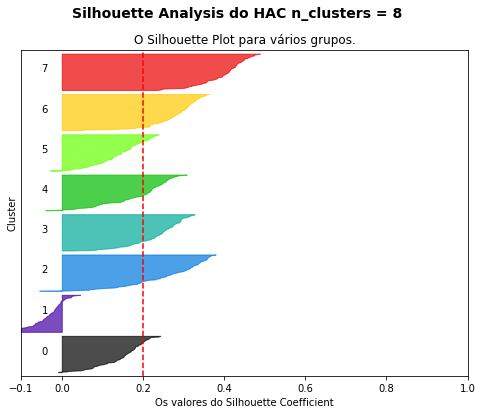

In [31]:
print('Índice interno: Silhueta para o critério ward')

plot_silhouette(df_train, model_hac, 'HAC')

In [32]:
# É possível notar que o critério single tem um desempenho bastante ruim, agregando as instâncias nos
# clusters completamente diferentes dos originais, inclusive deixando sete clusters com apenas uma instância.
# Na outra ponta temos o critério ward, que procura minimizar a variância dos clusters criados, com um
# desempenho muito bom, acertando quase todas instâncias das classes originais. No que se refere ao índice interno
# da silhueta, o valor também foi muito parecido com o visto no K-Means com inicialização K-Means++.
# Desta forma, será colocado foco no critério ward, que é o critério padrão da função.

In [33]:
# Método de plotagem do dendrograma retirado e modificado da página do scikit-learn:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html

def plot_dendrogram(model, **kwargs):
    plt.rcParams['figure.figsize'] = (12, 6)
    # Create linkage matrix and then plot the dendrogram
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    _ = plt.show()

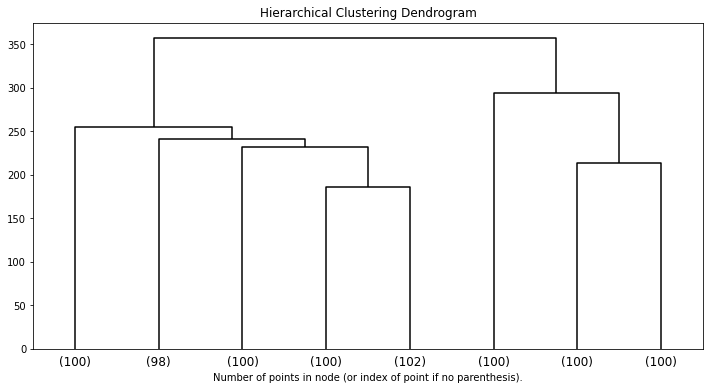

In [34]:
# Dendrograma mostrando o número de instâncias em cada cluster para o critério ward

plot_dendrogram(model_hac, truncate_mode='lastp', p=8, color_threshold=0, above_threshold_color='black')

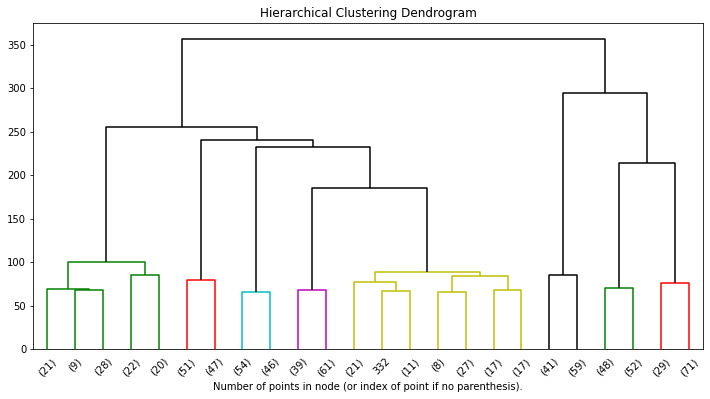

In [35]:
# Aumentando distância da truncagem para melhor visualizar clusters

plot_dendrogram(model_hac, truncate_mode='lastp', p=24, color_threshold=150, above_threshold_color='black')

In [36]:
a = 0
for cl in classes:
    print('\nClasse original:', cl)
    print(np.unique(model_hac.labels_[0+(a*100):100+(a*100)], return_counts=True))
    print(model_hac.labels_[0+(a*100):100+(a*100)])
    a += 1


Classe original: airplane
(array([2], dtype=int64), array([100], dtype=int64))
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]

Classe original: car
(array([6], dtype=int64), array([100], dtype=int64))
[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]

Classe original: cat
(array([1, 4], dtype=int64), array([ 3, 97], dtype=int64))
[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 1 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 1 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 1]

Classe original: dog
(array([1, 4], dtype=int64), array([99,  1], dtype=int64))
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 

Gatos agrupados como cachorro:
natural_images_100\cat\cat_0176.jpg Cluster: 1


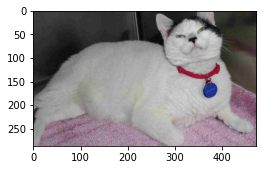

natural_images_100\cat\cat_0590.jpg Cluster: 1


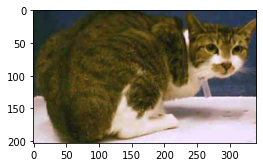

natural_images_100\cat\cat_0877.jpg Cluster: 1


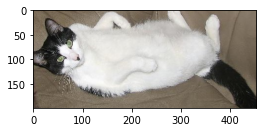


Cachorro agrupado como gato:
natural_images_100\dog\dog_0374.jpg Cluster: 4


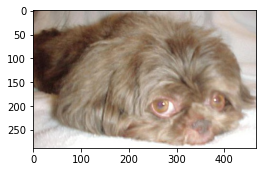

In [37]:
# Mostrando imagens dos objetos atribuídos a clusters que não correspondem a suas classes

plt.rcParams['figure.figsize'] = (4, 4)

print('Gatos agrupados como cachorro:')
for idx, c in enumerate(model_hac.labels_[200:300]):
    if c != 4:
        print(result.iloc[idx+200]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+200]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        
print('\nCachorro agrupado como gato:')        
for idx, c in enumerate(model_hac.labels_[300:400]):
    if c != 1:
        print(result.iloc[idx+300]['Path'], 'Cluster:', c)
        image = Image.open(result.iloc[idx+300]['Path'])
        fig, axes = plt.subplots()
        axes.imshow(image)
        plt.show()
        

Classe: airplane


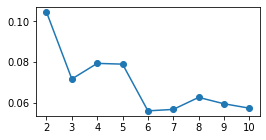

Classe: car


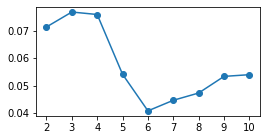

Classe: cat


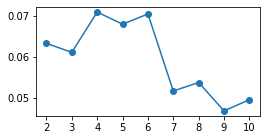

Classe: dog


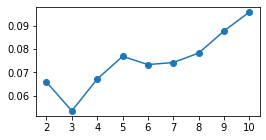

Classe: flower


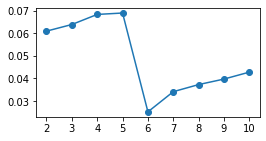

Classe: fruit


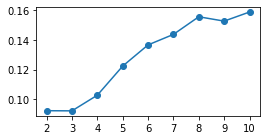

Classe: motorbike


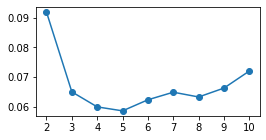

Classe: person


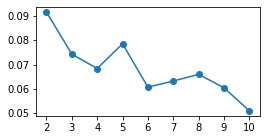

In [38]:
# Verificando para qual classe o algoritmo consegue formar o melhor conjunto de subgrupos baseado no método da silhueta
# e utilizando o critério ward

plt.rcParams['figure.figsize'] = (4, 2)

for i, cl in enumerate(classes) :
    
    print('Classe:', cl)
    clusters_range = range(2, int(np.sqrt(len(df_train[0+(i*100):100+(i*100)]))) + 1)
    silhouettes = []
    
    for k in clusters_range:

        model_hac = AgglomerativeClustering(n_clusters=k)
        model_hac.fit(df_train[0+(i*100):100+(i*100)])

        silhouettes.append(silhouette_score(df_train[0+(i*100):100+(i*100)], model_hac.labels_))
    
    plt.plot(clusters_range, silhouettes, '-o')
    plt.xticks(clusters_range)
    plt.show()

airplane com n_clusters=2


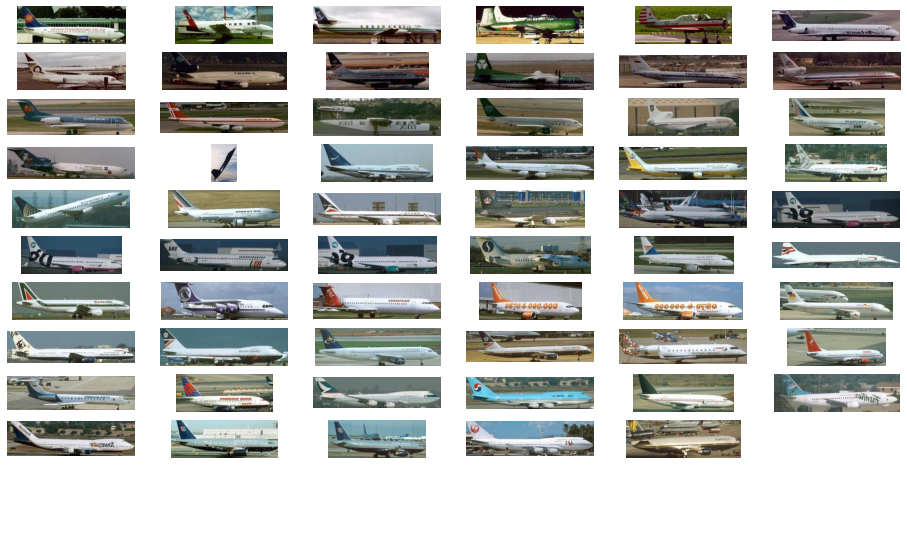

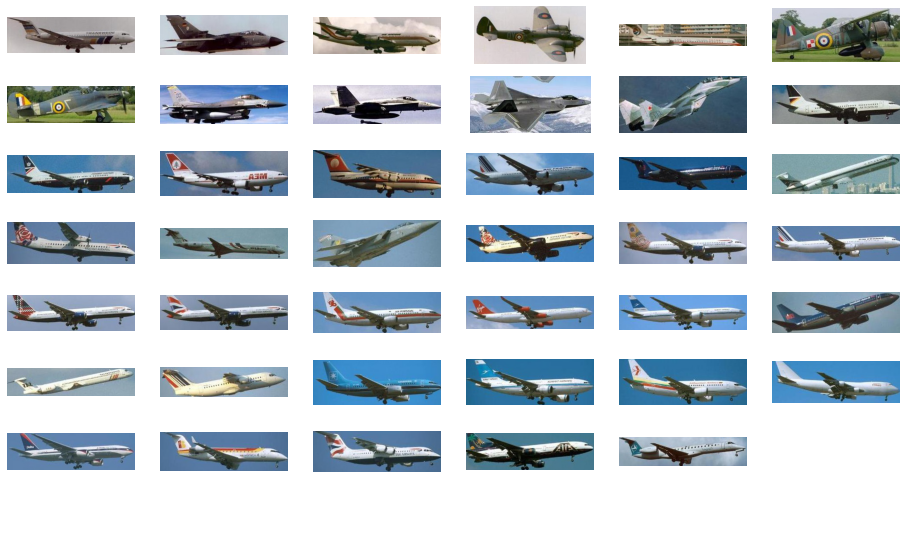

In [39]:
# Analisando os clusters para as classes com maiores valores de silhueta encontrados: airplane com n_clusters=2
# e fruit com n_clusters=10

print('airplane com n_clusters=2')

plt.rcParams['figure.figsize'] = (16, 10)

n_clusters = 2

model_hac = AgglomerativeClustering(n_clusters=n_clusters)
model_hac.fit(df_train[0:100])

cluster0 = []
cluster1 = []

for idx, c in enumerate(model_hac.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx]['Path'])
    else:
        cluster1.append(result.iloc[idx]['Path'])
        
for cl in [cluster0, cluster1]:
    
    ncols = 6
    nrows = int((len(cl)+1)/(ncols-1))
        
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.show()

In [40]:
# Entre os dois clusters gerados para a classe airplane, é possível notar que no primeiro os aviões estão em terra,
# com exceção de um, enquanto no segundo cluster todos estão voando, com exceção de dois

fruit com n_clusters=10


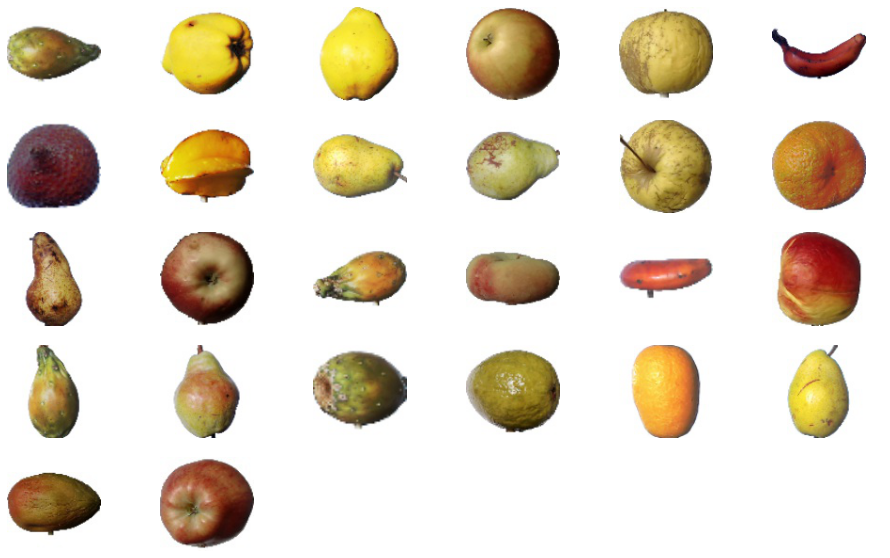

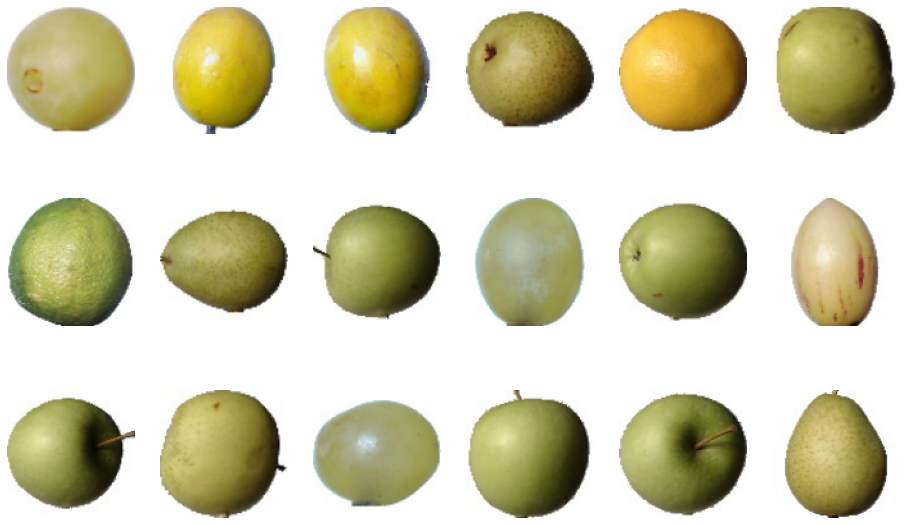

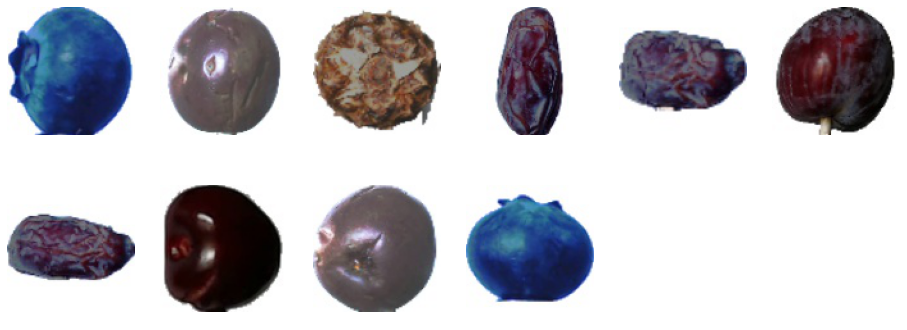

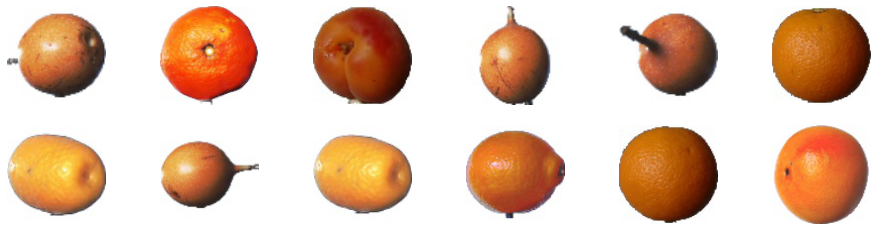

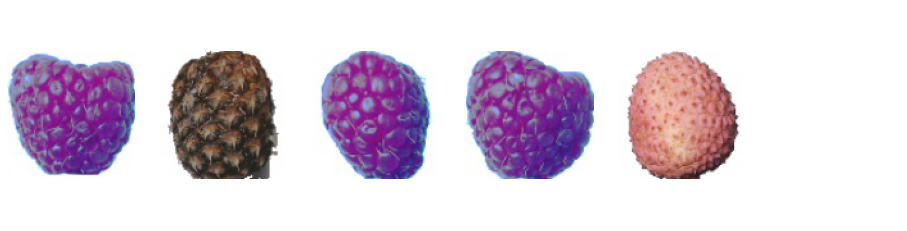

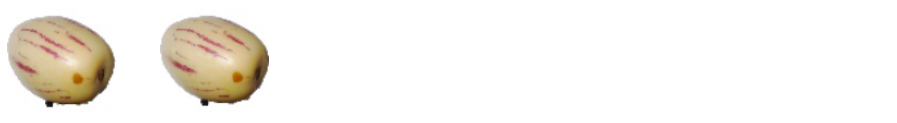

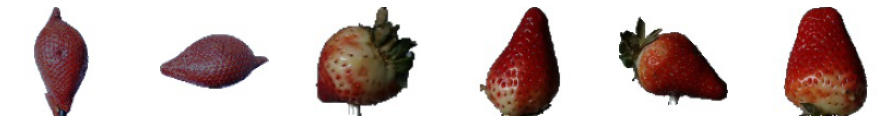

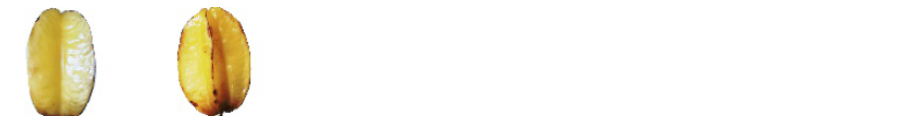

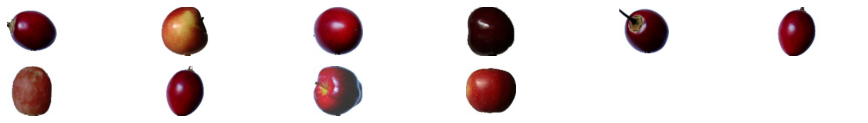

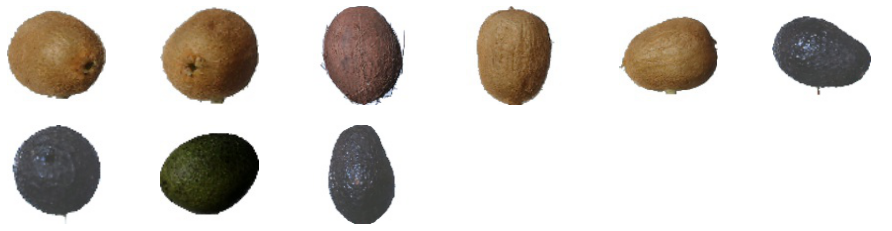

In [41]:
print('fruit com n_clusters=10')

# plt.rcParams['figure.figsize'] = (16, 8)

n_clusters = 10

model_hac = AgglomerativeClustering(n_clusters=n_clusters)
model_hac.fit(df_train[500:600])

cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []

for idx, c in enumerate(model_hac.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+500]['Path'])
    elif c == 1:
        cluster1.append(result.iloc[idx+500]['Path'])
    elif c == 2:
        cluster2.append(result.iloc[idx+500]['Path'])
    elif c == 3:
        cluster3.append(result.iloc[idx+500]['Path'])
    elif c == 4:
        cluster4.append(result.iloc[idx+500]['Path'])
    elif c == 5:
        cluster5.append(result.iloc[idx+500]['Path'])
    elif c == 6:
        cluster6.append(result.iloc[idx+500]['Path'])
    elif c == 7:
        cluster7.append(result.iloc[idx+500]['Path'])
    elif c == 8:
        cluster8.append(result.iloc[idx+500]['Path'])
    else:
        cluster9.append(result.iloc[idx+500]['Path'])
    
for cl in [cluster0, cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8, cluster9]:
    
    ncols = 6
    nrows = int((len(cl)+1)/(ncols-1))
    
    if nrows == 0:
        nrows = 1
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    plt.show()

In [42]:
# É possível notar que as frutas foram agrupadas basicamente conforme sua cor e textura ao longo dos 10 clusters.
# Ainda que em alguns clusters haja diferentes frutas, em outros se percebe que ficaram juntas todas as instâncias
# de uma fruta em particular, como é o caso das amoras e dos morangos.

## 3 - DBSCAN

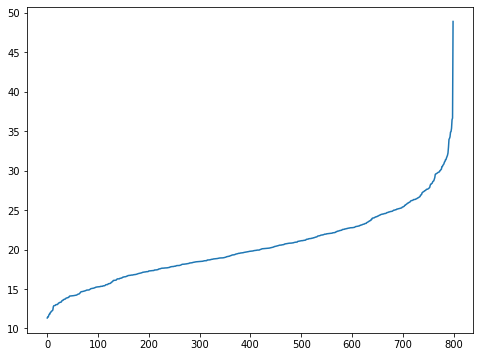

In [65]:
# Utilizando o K-dist plot para ter primeira base do valor de eps considerando n_neighbors=4

n_neighbors = 4
knn = NearestNeighbors(n_neighbors=n_neighbors)
neighbors = knn.fit(df_train)
distances, indices = neighbors.kneighbors(df_train)

distances = np.sort(distances, axis=0)
distances = distances[:, n_neighbors-1]

plt.rcParams['figure.figsize'] = (8, 6)
plt.plot(distances)

In [44]:
# Os valores de eps ideiais parecem ficar entre 20 e 30. Por isso, faremos um laço para tentar descobrir quais parâmentros
# do DBSCAN obtêm os melhores valores de adjusted rand index com um conjunto de 8 clusters, ou seja,
# os parâmetros que acertam mais instâncias e classes formando 8 clusters e 1 classe de outliers.

In [45]:
ars = 0

for i in np.arange(20, 30.5, 0.5):
    for j in range(2, 8, 1):
        model_dbs = DBSCAN(eps=i, min_samples=j)
        model_dbs.fit(df_train)
        ars1 = adjusted_rand_score(model_dbs.labels_, df_labels)
        if ars1 > ars and len(np.unique(model_dbs.labels_)) == 9:
            ars = ars1
            eps_ideal = i
            min_samples_ideal = j

print('Melhor Adjusted Rand Score foi de {} encontrado para eps = {} e min_samples = {}'
      .format(ars, eps_ideal, min_samples_ideal))

Melhor Adjusted Rand Score foi de 0.6640193919024362 encontrado para eps = 22.0 e min_samples = 4


In [46]:
model_dbs = DBSCAN(eps=22, min_samples=4)
model_dbs.fit(df_train)

ars = adjusted_rand_score(model_dbs.labels_, df_labels)
comp = completeness_score(model_dbs.labels_, df_labels)

print('Índices externos:\n\nAdjusted Rand Score: {}\nCompleteness Score: {}'.format(ars, comp))

Índices externos:

Adjusted Rand Score: 0.6640193919024362
Completeness Score: 0.7898774733610946


Índice interno: Silhueta média
Para n_clusters = 8 o Silhouette Score médio é: 0.16064653


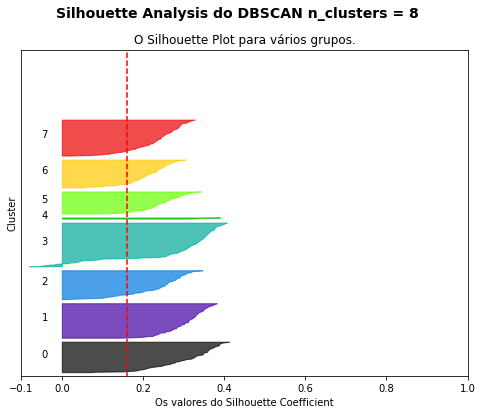

In [47]:
print('Índice interno: Silhueta média')

model_dbs.n_clusters = 8

plot_silhouette(df_train, model_dbs, 'DBSCAN')

In [48]:
print(np.unique(model_dbs.labels_, return_counts=True))

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7], dtype=int64), array([180,  84,  95,  80, 120,   4,  61,  77,  99], dtype=int64))


In [49]:
# Analisando as instâncias das classes e a que cluster foram atribuídos

a = 0

for cl in classes:
    print('\nClasse original:', cl)
    print(np.unique(model_dbs.labels_[0+(a*100):100+(a*100)], return_counts=True))
    print(model_dbs.labels_[0+(a*100):100+(a*100)])
    a += 1


Classe original: airplane
(array([-1,  0], dtype=int64), array([16, 84], dtype=int64))
[ 0  0  0 -1  0 -1 -1  0  0  0  0 -1  0  0 -1  0  0 -1  0  0  0 -1  0  0
 -1 -1  0  0 -1 -1 -1  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 -1  0  0  0  0  0  0  0
  0  0  0  0 -1 -1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0]

Classe original: car
(array([-1,  1], dtype=int64), array([ 5, 95], dtype=int64))
[ 1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1 -1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1
 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1
  1  1  1  1]

Classe original: cat
(array([-1,  2], dtype=int64), array([20, 80], dtype=int64))
[ 2  2  2  2 -1  2  2  2  2  2  2  2  2  2  2  2  2 -1 -1  2  2  2  2  2
  2  2  2  2  2 -1  2  2 -1  2 -1  2  2 -1  2  2  2  2  2  2 

outliers


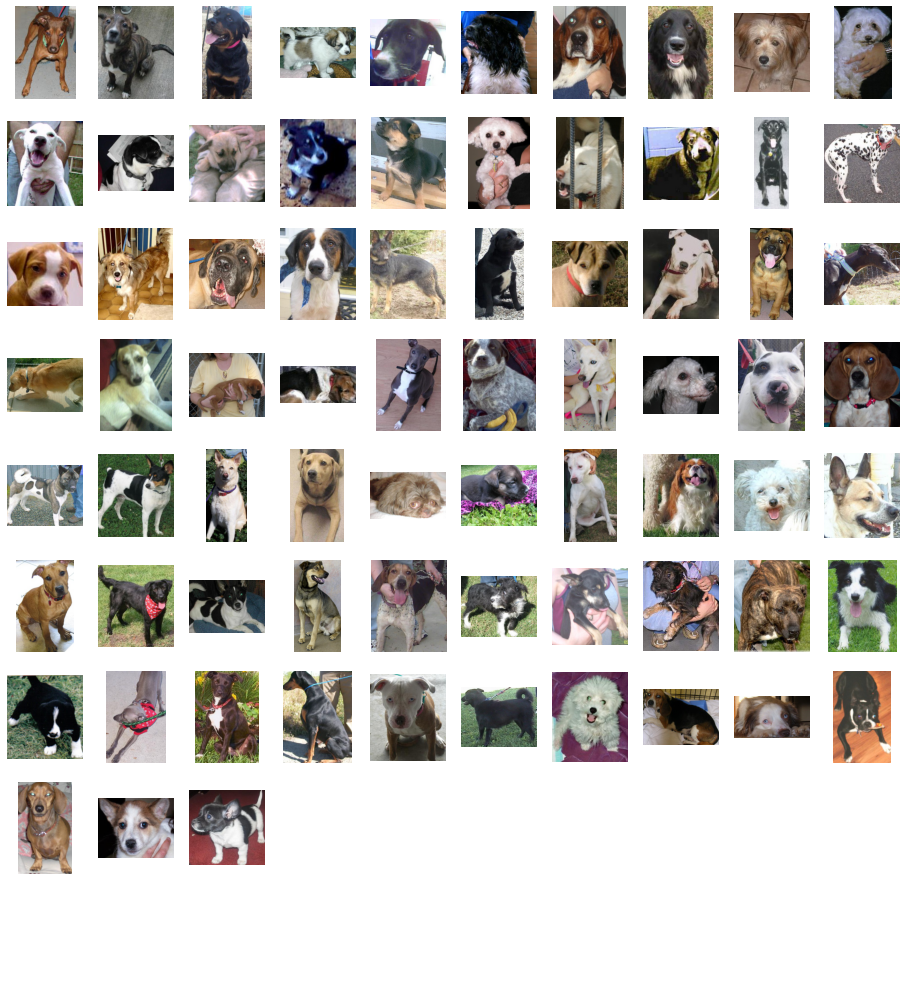

cluster 3


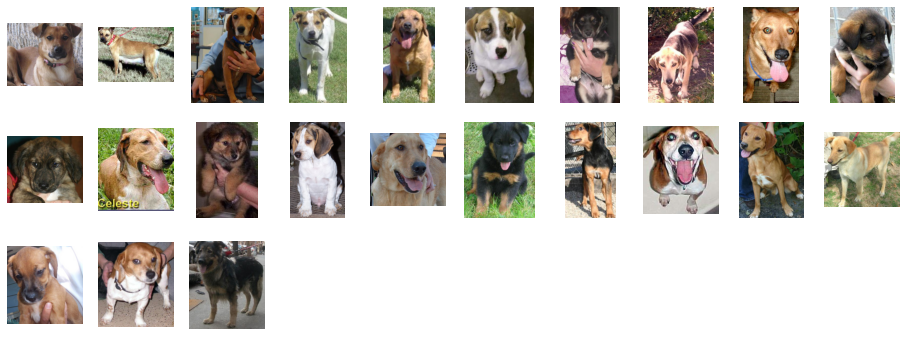

cluster 4


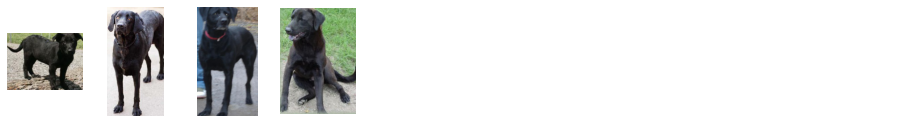

In [50]:
# Analisando e exibindo imagens dos clusters criados na classe dog

clustermenos1 = []
cluster3 = []
cluster4 = []

for idx, c in enumerate(model_dbs.labels_[300:400]):
    if c == -1:
        clustermenos1.append(result.iloc[idx+300]['Path'])
    elif c == 3:
        cluster3.append(result.iloc[idx+300]['Path'])
    else:
        cluster4.append(result.iloc[idx+300]['Path'])
        
for cl, n in zip([clustermenos1, cluster3, cluster4], ['outliers', 'cluster 3', 'cluster 4']):
    
    ncols = 10
    nrows = int((len(cl)+1)/(ncols-2))
    
    if nrows == 0:
        nrows = 1
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    print(n)
    plt.show()
        

In [51]:
# É possível notar que o algoritmo DBSCAN, mesmo forçado a encontrar oito grupos, ainda assim não teve um bom desempenho,
# como é possível verificar pelos índices externos, em que se obteve 0.6640 no Adjusted Rand Score e 0.7898 no Completeness
# Score, e no índice interno Silhouette Score médio, em que se obteve 0.1606.

# Além disso, percebe-se maior incapacidade de agrupar as imagens que pertencem nos grupos corretos. Não se nota tanta
# mistura de classes de imagens entre os clusters, mas há 180 instâncias classificadas como outliers, além de o
# algoritmo ter criado um cluster com apenas 4 instâncias dentro da classe dos cachorros.

In [52]:
# Dentro de cada classe, procuraremos o conjunto de eps e min_samples que gera o maior silhouette score com um
# número mínimo de três clusters, uma vez que o DBSCAN tende a encadear bastante as instâncias e aparenta
# ter preferência por formar menos clusters, algo que foi notado quando testado este laço com um número
# mínimo de clusters = 3. Depois analisarmos os clusters criados para aquela classe.

a = 0

sil = -1

for cl in classes:
    
    for i in np.arange(2, 30, 1):
        for j in range(2, 8, 1):
            model_dbs = DBSCAN(eps=i, min_samples=j)
            model_dbs.fit(df_train[0+(a*100):100+(a*100)])
            if len(np.unique(model_dbs.labels_)) >= 4:
                sil1 = silhouette_score(df_train[0+(a*100):100+(a*100)], model_dbs.labels_)
                if sil1 > sil:
                    sil = sil1
                    eps_ideal = i
                    min_samples_ideal = j
                    classe1 = cl
                    n_clusters1 = len(np.unique(model_dbs.labels_))
                
    a += 1
    
print('Melhor Silhouette Score foi de {} encontrado para eps = {} e min_samples = {} na classe {}, com \
{} clusters gerados e mais um conjunto de outliers'.format(sil, eps_ideal, min_samples_ideal, classe1, n_clusters1-1))

Melhor Silhouette Score foi de 0.11548146605491638 encontrado para eps = 19 e min_samples = 2 na classe fruit, com 9 clusters gerados e mais um conjunto de outliers


In [53]:
model_dbs = DBSCAN(eps=19, min_samples=2)
model_dbs.fit(df_train[500:600])

silhouette_score(df_train[500:600], model_dbs.labels_)

0.115481466

In [54]:
np.unique(model_dbs.labels_, return_counts=True)

(array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8], dtype=int64),
 array([28, 24,  3, 28,  5,  2,  2,  2,  4,  2], dtype=int64))

clusters da classe fruit com a parametrização encontrada


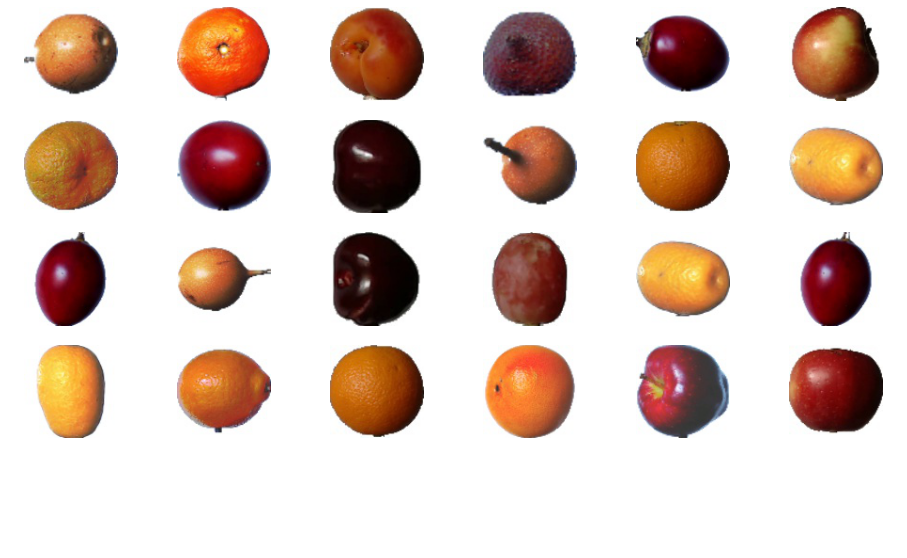

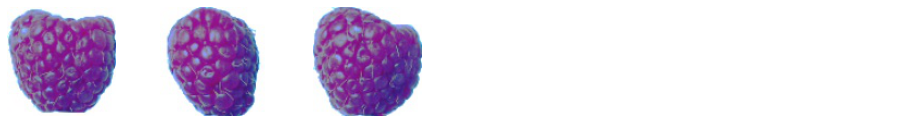

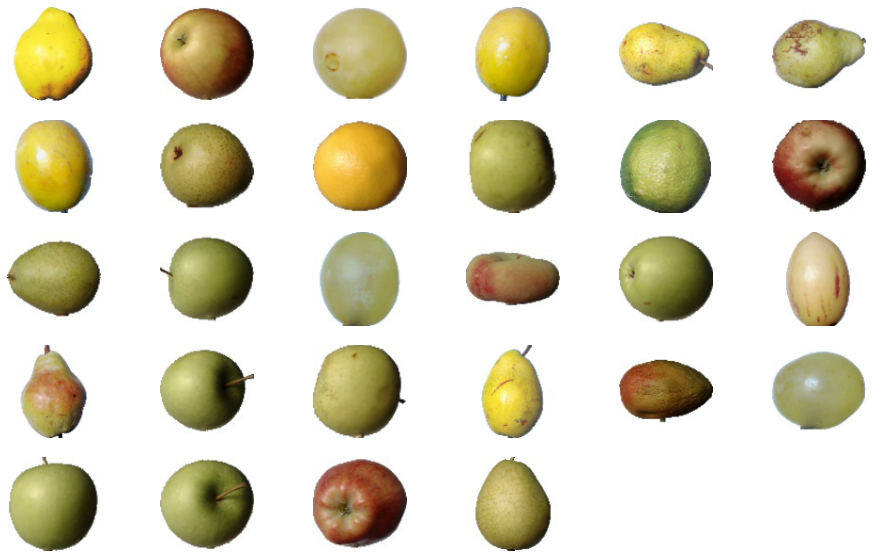

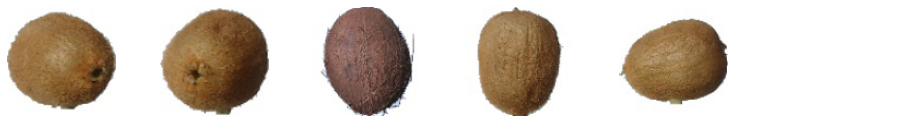

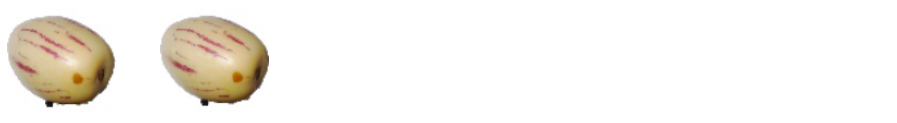

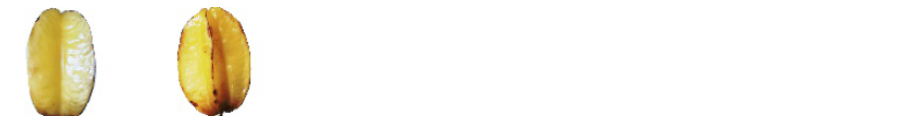

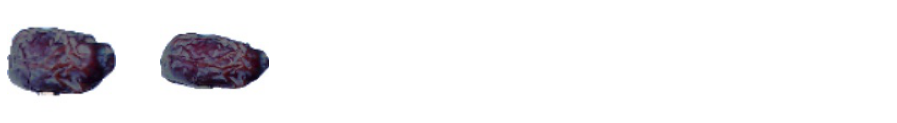

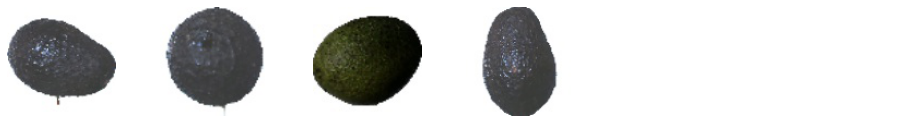

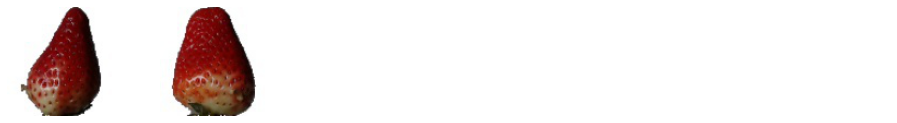

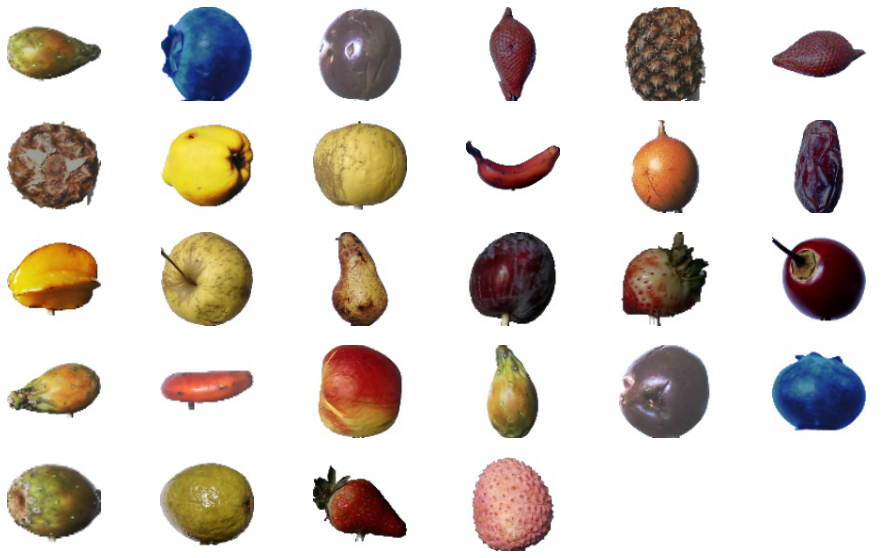

In [55]:
print('clusters da classe fruit com a parametrização encontrada')

n_clusters = 10

model_dbs = DBSCAN(eps=19, min_samples=2)
model_dbs.fit(df_train[500:600])

cluster0 = []
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
clustermenos1 = []

for idx, c in enumerate(model_dbs.labels_):
    if c == 0:
        cluster0.append(result.iloc[idx+500]['Path'])
    elif c == 1:
        cluster1.append(result.iloc[idx+500]['Path'])
    elif c == 2:
        cluster2.append(result.iloc[idx+500]['Path'])
    elif c == 3:
        cluster3.append(result.iloc[idx+500]['Path'])
    elif c == 4:
        cluster4.append(result.iloc[idx+500]['Path'])
    elif c == 5:
        cluster5.append(result.iloc[idx+500]['Path'])
    elif c == 6:
        cluster6.append(result.iloc[idx+500]['Path'])
    elif c == 7:
        cluster7.append(result.iloc[idx+500]['Path'])
    elif c == 8:
        cluster8.append(result.iloc[idx+500]['Path'])
    else:
        clustermenos1.append(result.iloc[idx+500]['Path'])
    
for cl in [cluster0, cluster1, cluster2, cluster3, cluster4, cluster5, cluster6, cluster7, cluster8, clustermenos1]:
    
    ncols = 6
    nrows = int((len(cl)+1)/(ncols-1))
    
    if nrows == 0:
        nrows = 1
    
    plt.rcParams['figure.figsize'] = (16, nrows*2)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for i, path in enumerate(cl):
        image = Image.open(path)
        axes.ravel()[i].imshow(image)
    
    [ax.set_axis_off() for ax in axes.ravel()]
    
    plt.show()

In [56]:
# Para esta última clusterização realizada pelo DBSCAN na classe fruit, percebe-se grupos com imagens de frutas
# bastante semelhantes. Entretanto, o último conjunto, que se refere aos outliers, ainda é muito grande. Ou seja, assim como
# ocorreu na clusterização de todo o dataset, para diversas instânciaso algoritmo continua incapaz de encontrar
# um cluster adequado.

## PCA

In [57]:
# Aplicaremos redução de dimensionalidade com o método PCA, escolhendo o número de componentes com base na regra de Kaiser.
# Depois testaremos novamente os algoritmos com os melhores parâmetros encontrados anteriormente para analisar se ocorrem
# modificações nos resultados.

pca = PCA()
pca.fit(df_train)

print('Eigenvalues: ')
print(np.round(pca.explained_variance_, decimals=1))

print('Número de componentes pela regra de Kaiser: ', (np.round(pca.explained_variance_, decimals=1) >= 1).sum())

Eigenvalues: 
[85.9 60.5 48.6 38.7 37.1 30.9 22.2 11.1  9.1  8.3  7.4  7.2  7.   6.9
  6.1  5.9  5.7  5.5  5.2  5.   4.8  4.6  4.5  4.2  4.1  4.1  3.9  3.7
  3.6  3.5  3.4  3.3  3.1  3.   3.   2.9  2.9  2.7  2.7  2.6  2.5  2.4
  2.3  2.2  2.2  2.2  2.1  2.   2.   1.9  1.9  1.9  1.9  1.8  1.8  1.8
  1.7  1.7  1.6  1.6  1.6  1.5  1.5  1.5  1.5  1.4  1.4  1.4  1.3  1.3
  1.3  1.3  1.2  1.2  1.2  1.2  1.2  1.2  1.1  1.1  1.1  1.1  1.1  1.
  1.   1.   1.   1.   1.   1.   0.9  0.9  0.9  0.9  0.9  0.9  0.9  0.9
  0.8  0.8  0.8  0.8  0.8  0.8  0.8  0.8  0.8  0.7  0.7  0.7  0.7  0.7
  0.7  0.7  0.7  0.7  0.7  0.7  0.7  0.7  0.6  0.6  0.6  0.6  0.6  0.6
  0.6  0.6  0.6  0.6  0.6  0.6  0.6  0.6  0.5  0.5  0.5  0.5  0.5  0.5
  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
  0.5  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4
  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.4
  0.4  0.4  0.4  0.4  0.4  0.4  0.4  0.3  0.3  0.3  0.3  0.3  0.

[]

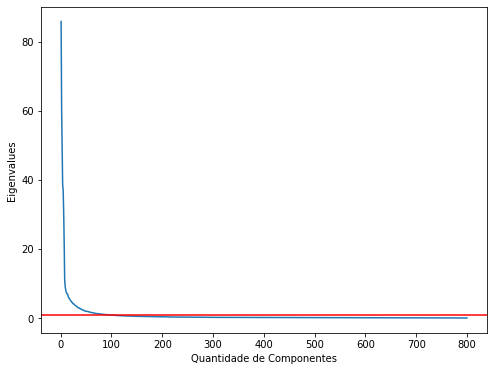

In [58]:
# Gráfico da regra de Kaiser
x = np.arange(pca.explained_variance_.shape[0]) + 1
y = pca.explained_variance_

plt.rcParams['figure.figsize'] = (8, 6)

plt.plot(x, y)
plt.axhline(1.0, color = 'red')
plt.xlabel('Quantidade de Componentes')
plt.ylabel('Eigenvalues')
plt.plot()

In [59]:
pca = PCA(n_components = 90)
pca.fit(df_train)

feat_pca = pca.transform(df_train)
pca.components_

array([[-0.01414753,  0.01351427, -0.00011516, ...,  0.01394315,
         0.01157314, -0.00578368],
       [ 0.00794835, -0.00732135,  0.01368178, ...,  0.02592611,
         0.02690257, -0.00062493],
       [-0.04056699,  0.00204198,  0.01459124, ...,  0.00590126,
         0.00647836, -0.00156098],
       ...,
       [-0.00849909,  0.02891312, -0.02757515, ...,  0.01032743,
        -0.01570964,  0.00078819],
       [-0.01381149, -0.01278895, -0.01007742, ..., -0.00115941,
         0.03087727, -0.01183897],
       [ 0.0406815 ,  0.01399203, -0.00603411, ..., -0.00801203,
         0.00710027,  0.00898141]], dtype=float32)

In [60]:
colunasPCA = ['PCA_' + str(i) for i in range(1, 91)]

df_train_PCA = pd.DataFrame(data = feat_pca, columns = colunasPCA)

df_train_PCA.head()

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,...,PCA_81,PCA_82,PCA_83,PCA_84,PCA_85,PCA_86,PCA_87,PCA_88,PCA_89,PCA_90
0,16.570496,26.927713,3.703815,-3.079424,0.350959,-0.545730,-1.231853,-3.436229,2.017869,-1.618720,...,-1.354731,3.082376,1.444989,0.918746,-0.209103,-1.495367,0.534781,0.127757,0.951613,-1.068491
1,11.756995,15.865354,2.208981,-0.896498,-1.663045,1.166195,1.996090,-3.172838,-1.508501,-1.432348,...,0.289998,0.044628,-0.995530,0.484469,-1.296882,0.128792,-1.237368,-1.209538,0.101784,-1.059310
2,11.824598,13.363098,3.374135,-0.893726,-1.129574,-1.555187,-1.938357,-0.490459,-3.879097,-0.009621,...,-0.384211,-0.166602,-1.456290,1.394987,-0.106835,0.225531,-0.617742,0.525709,1.223713,-0.738665
3,7.446854,5.477975,-0.604785,-0.179500,0.069774,-2.531855,1.657240,-0.613638,-4.911263,1.372894,...,-1.198314,-0.955479,-1.429420,1.365939,-1.192221,0.677107,-2.249130,-0.100863,0.258203,-1.590533
4,10.098981,11.252542,2.215637,-3.051002,-3.321726,2.435110,1.086752,-2.389794,-1.509094,0.616493,...,0.106059,0.320006,-1.635691,0.516334,-0.409087,-2.029497,-0.499685,-1.348022,-0.607606,0.069622


In [61]:
# Fazendo o fit dos modelos agora no dataset reduzido com componentes PCA

model_k_m = KMeans(n_clusters=8)
model_k_m.fit(df_train_PCA)

model_hac = AgglomerativeClustering(n_clusters=8)
model_hac.fit(df_train_PCA)

model_dbs = DBSCAN(eps=22, min_samples=4)
model_dbs.fit(df_train_PCA)

DBSCAN(eps=22, min_samples=4)

In [62]:
# Verificando valores dos índices externos e interno

for model, nome in zip([model_k_m, model_hac, model_dbs], ['K-Means', 'HAC', 'DBSCAN']):
    print('\nÍndices com variáveis PCA no algortimo ', nome)
    print('Adjusted Rand Score: ', adjusted_rand_score(model.labels_, df_labels))
    print('Completeness Score: ', completeness_score(model.labels_, df_labels))
    print('Silhouette Score: ', silhouette_score(df_train_PCA, model.labels_))



Índices com variáveis PCA no algortimo  K-Means
Adjusted Rand Score:  0.9914106479870332
Completeness Score:  0.9898888353539548
Silhouette Score:  0.27392995

Índices com variáveis PCA no algortimo  HAC
Adjusted Rand Score:  0.982968366670443
Completeness Score:  0.9836924601498036
Silhouette Score:  0.2720636

Índices com variáveis PCA no algortimo  DBSCAN
Adjusted Rand Score:  0.0008842736274570622
Completeness Score:  0.014031875895278684
Silhouette Score:  0.15816624


In [63]:
# Análise dos resultados dos índices com as variáveis PCA em comparação aos resultados obtidos nos dados originais

# K-Means (inicialização k-means++)
# Percebe-se que os índices externos não se modificaram mas o índice interno da silhueta se melhorou, possivelmente
# pois agora existem menos features que tendem a representar uma menor distância no cálculo do indicador.

# HAC
# É possível notar que os índices externos diminuiram em apenas cerca de 0.01, enquanto o índice externo da silhueta
# melhorou em cerca de 0.07, provavelmente pelo mesmo motivo descrito para o K-Means.

# DBSCAN
# Neste caso vemos que os indicadores externos pioraram completamente, o que era esperado, pois como agora se tratam
# de novas variáveis, seria necessário buscar novamente valores ideais de eps e min_samples. Para o índice interno
# da silhueta, por outro lado, não se viu grande piora.

# Logo, é possível perceber que o método de redução de dimensionalidade PCA foi satisfatório.

## Conclusões

In [64]:
# Neste trabalho, pudemos observar diversas dificuldades inerentes à utilização de algoritmos de aprendizado não
# supervisionado. Estas dificuldades, na maior parte do tempo estão, aparentemente, na busca pelos melhores parâmetros
# dos modelos, algo que pode ser bastante complexo a depender dos dados com que se está trabalhando e também das
# características de cada algoritmo.

# Neste caso, em que tínhamos features de imagens, percebemos que os algoritmos K-Means e HAC se mostraram bastante
# eficientes, pois foi possível chegar a parâmetros que fizeram com que quase todas instâncias fossem classificadas
# corretamente, como bem pode ser visto por meio dos indicadores externos. Por outro lado, o algoritmo DBSCAN
# não se mostrou eficiente, possivelmente pois tem dificuldade para lidar com um espaço esparso com grandes números
# de features, de maneira que não consegue encontrar um cluster adequado para diversas instâncias e acaba por
# classificá-las como outliers.